In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from backtester.dataSource.yahoo_data_source import YahooStockDataSource

startDateStr = '2013/1/1'
endDateStr = '2017/12/31'
cachedFolderName = '/Users/ayushsharma/Documents/Finance/yahooData/'
dataSetId = 'testPairsTrading'

instrumentIds = ['^BSESN']
ds = YahooStockDataSource(cachedFolderName=cachedFolderName,
                            dataSetId=dataSetId,
                            instrumentIds=instrumentIds,
                            startDateStr=startDateStr,
                            endDateStr=endDateStr,
                            event='history')
bse_sensex_prices = ds.getBookDataByFeature()['Adj Close']

instrumentIds = ['^NSEI']
ds = YahooStockDataSource(cachedFolderName=cachedFolderName,
                            dataSetId=dataSetId,
                            instrumentIds=instrumentIds,
                            startDateStr=startDateStr,
                            endDateStr=endDateStr,
                            event='history')
nse_nifty_prices = ds.getBookDataByFeature()['Adj Close']

instrumentIds = ['SBIN.BO','TATASTEEL.BO','LT.BO','RELIANCE.BO','INFY.BO','BHARTIARTL.BO','TCS.BO','TATAMOTORS.BO','SUNPHARMA.BO','ITC.BO']
ds = YahooStockDataSource(cachedFolderName=cachedFolderName,
                            dataSetId=dataSetId,
                            instrumentIds=instrumentIds,
                            startDateStr=startDateStr,
                            endDateStr=endDateStr,
                            event='history')
sensex_stock_prices = ds.getBookDataByFeature()['Adj Close']

instrumentIds = ['SBIN.NS','TATASTEEL.NS','LT.NS','RELIANCE.NS','INFY.NS','BHARTIARTL.NS','TCS.NS','TATAMOTORS.NS','SUNPHARMA.NS','ITC.NS']
ds = YahooStockDataSource(cachedFolderName=cachedFolderName,
                            dataSetId=dataSetId,
                            instrumentIds=instrumentIds,
                            startDateStr=startDateStr,
                            endDateStr=endDateStr,
                            event='history')
nifty_stock_prices = ds.getBookDataByFeature()['Adj Close']

instrumentIds = ['COLPAL.BO','BRITANNIA.BO','DLF.BO','HAVELLS.BO','DABUR.BO','HINDZINC.BO','PIDILITIND.BO','PGHH.BO','TATAPOWER.BO','CUMMINSIND.BO']
ds = YahooStockDataSource(cachedFolderName=cachedFolderName,
                            dataSetId=dataSetId,
                            instrumentIds=instrumentIds,
                            startDateStr=startDateStr,
                            endDateStr=endDateStr,
                            event='history')
non_sensex_stock_prices = ds.getBookDataByFeature()['Adj Close']


instrumentIds = ['COLPAL.NS','BRITANNIA.NS','DLF.NS','HAVELLS.NS','DABUR.NS','HINDZINC.NS','PIDILITIND.NS','PGHH.NS','TATAPOWER.NS','CUMMINSIND.NS']
ds = YahooStockDataSource(cachedFolderName=cachedFolderName,
                            dataSetId=dataSetId,
                            instrumentIds=instrumentIds,
                            startDateStr=startDateStr,
                            endDateStr=endDateStr,
                            event='history')
non_nifty_stock_prices = ds.getBookDataByFeature()['Adj Close']

Processing data for stock: ^BSESN
20% done...
40% done...
60% done...
80% done...
Processing data for stock: ^NSEI


/Users/ayushsharma/anaconda3/lib/python3.6/site-packages/backtester/dataSource/yahoo_data_source.py:182: FutureWarning:

set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead



20% done...
40% done...
60% done...
80% done...
Processing data for stock: SBIN.BO
Processing data for stock: TATASTEEL.BO
Processing data for stock: LT.BO
Processing data for stock: RELIANCE.BO
Processing data for stock: INFY.BO
Processing data for stock: BHARTIARTL.BO
Processing data for stock: TCS.BO
Processing data for stock: TATAMOTORS.BO
Processing data for stock: SUNPHARMA.BO
Processing data for stock: ITC.BO
20% done...
40% done...
60% done...
80% done...
Processing data for stock: SBIN.NS
Processing data for stock: TATASTEEL.NS
Processing data for stock: LT.NS
Processing data for stock: RELIANCE.NS
Processing data for stock: INFY.NS
Processing data for stock: BHARTIARTL.NS
Processing data for stock: TCS.NS
Processing data for stock: TATAMOTORS.NS
Processing data for stock: SUNPHARMA.NS
Processing data for stock: ITC.NS
20% done...
40% done...
60% done...
80% done...
Processing data for stock: COLPAL.BO
Processing data for stock: BRITANNIA.BO
Processing data for stock: DLF.BO
P

In [2]:
bse_sensex_prices = bse_sensex_prices[bse_sensex_prices!='null']
bse_sensex_returns = ((bse_sensex_prices.shift(-1) - bse_sensex_prices)/bse_sensex_prices).dropna().astype('float64')

nse_nifty_prices = nse_nifty_prices[nse_nifty_prices!='null']
nse_nifty_returns = ((nse_nifty_prices.shift(-1) - nse_nifty_prices)/nse_nifty_prices).dropna().astype('float64')

sensex_stock_prices = sensex_stock_prices[sensex_stock_prices!='null']
sensex_stock_returns = ((sensex_stock_prices.shift(-1) - sensex_stock_prices)/sensex_stock_prices).dropna().astype('float64')

nifty_stock_prices = nifty_stock_prices[nifty_stock_prices!='null']
nifty_stock_returns = ((nifty_stock_prices.shift(-1) - nifty_stock_prices)/nifty_stock_prices).dropna().astype('float64')

non_sensex_stock_prices = non_sensex_stock_prices[non_sensex_stock_prices!='null']
non_sensex_stock_returns = ((non_sensex_stock_prices.shift(-1) - non_sensex_stock_prices)/non_sensex_stock_prices).dropna().astype('float64')

non_nifty_stock_prices = non_nifty_stock_prices[non_nifty_stock_prices!='null']
non_nifty_stock_returns = ((non_nifty_stock_prices.shift(-1) - non_nifty_stock_prices)/non_nifty_stock_prices).dropna().astype('float64')

In [3]:
bse = pd.concat([bse_sensex_prices, sensex_stock_prices, non_sensex_stock_prices], axis=1, keys=['index', 'in', 'out'])

nse = pd.concat([nse_nifty_prices, nifty_stock_prices, non_nifty_stock_prices], axis=1, keys=['index', 'in', 'out'])


In [4]:
bse[bse == "null"] = np.nan
bse.fillna(method='ffill', inplace=True)
bse.fillna(method='bfill', inplace=True)
bse

index          in                                        \
                  ^BSESN     SBIN.BO TATASTEEL.BO        LT.BO RELIANCE.BO   
2013-01-01  19714.240234  189.356583   388.741577   645.995300  380.643585   
2013-01-02  19714.240234  189.356583   388.830261   655.599670  383.858429   
2013-01-03  19764.779297  192.865036   391.890198   651.145996  389.654205   
2013-01-04  19784.080078  192.865036   384.395630   647.347351  389.744781   
2013-01-07  19691.419922  192.865036   390.737152   632.135132  387.209106   
2013-01-08  19742.519531  194.621231   384.661713   622.988037  385.035675   
2013-01-09  19666.589844  194.621231   374.905487   616.525513  385.579010   
2013-01-10  19663.550781  194.621231   372.643799   614.477295  384.673431   
2013-01-11  19663.640625  194.621231   369.761261   609.067932  380.009613   
2013-01-14  19906.410156  194.995880   375.659332   618.175598  383.428253   
2013-01-15  19986.820313  194.995880   376.147186   619.747070  382.998047   
2013-01-16  19817.630859  194.995880   368.031769   613.363220  389.586304   
2013-01-17  19964.029297  194.995880   371.269104   607.736389  402.830627   
2013-01-18  20039.039063  194.995880   367.765656   611.076782  407.041595   
2013-01-21  20101.820313  194.995880   367.233521   623.306580  416.595612   
2013-01-22  19981.570313  192.349899   362.931885   617.360413  416.821991   
2013-01-23  20026.609375  192.349899   361.690186   620.900391  418.112488   
2013-01-24  19923.779297  191.885468   358.807648   630.564636  414.014679   
2013-01-25  20103.529297  196.166687   360.581543   639.234802  412.905334   
2013-01-28  20103.349609  196.166687   359.872009   633.825378  406.452972   
2013-01-29  19990.900391  191.799622   353.840881   634.203125  399.615753   
2013-01-30  20005.000000  190.090256   360.049408   622.013489  407.086884   
2013-01-31  19894.980469  190.183929   359.029388   613.621643  401.426941   
2013-02-01  19781.189453  190.183929   355.437317   610.440674  404.551208   
2013-02-04  19751.189453  190.183929   350.337494   609.744507  401.336365   
2013-02-05  19659.820313  190.183929   350.115753   609.884094  396.808411   
2013-02-06  19639.720703  183.502594   352.333099   602.367310  396.151855   
2013-02-07  19580.320313  183.502594   346.479340   594.989441  394.408539   
2013-02-08  19484.769531  183.502594   342.976013   600.278809  391.306885   
2013-02-11  19460.570313  183.502594   341.778625   592.722717  392.936981   
...                  ...         ...          ...          ...         ...   
2017-11-17  33342.800781  337.399994   701.349976  1221.250000  909.700012   
2017-11-20  33359.898438  333.049988   700.700012  1227.750000  918.849976   
2017-11-21  33478.351563  330.750000   711.250000  1221.699951  932.400024   
2017-11-22  33561.550781  335.200012   711.599976  1221.250000  930.250000   
2017-11-23  33588.078125  334.899994   711.250000  1216.300049  945.150024   
2017-11-24  33679.238281  332.250000   707.750000  1216.300049  949.500000   
2017-11-27  33724.441406  335.250000   701.849976  1222.599976  950.700012   
2017-11-28  33618.589844  332.649994   704.250000  1212.300049  942.950012   
2017-11-29  33602.761719  328.799988   709.299988  1217.300049  945.450012   
2017-11-30  33149.351563  320.450012   695.150024  1216.849976  922.599976   
2017-12-01  32832.941406  312.549988   680.700012  1212.599976  909.849976   
2017-12-04  32869.718750  313.299988   687.700012  1217.849976  901.500000   
2017-12-05  32802.441406  319.299988   675.950012  1207.300049  911.500000   
2017-12-06  32597.179688  312.250000   668.049988  1190.050049  927.500000   
2017-12-07  32949.210938  316.600006   687.900024  1219.150024  930.650024   
2017-12-08  33250.300781  313.149994   696.849976  1219.300049  920.950012   
2017-12-11  33455.789063  318.299988   700.000000  1221.400024  915.900024   
2017-12-12  33227.988281  318.399994   689.200012  1202.849976  915.049988   
2017-12-13  33053.039063  313.250000   68

In [5]:
nse[nse == "null"] = np.nan
nse.fillna(method='ffill', inplace=True)
nse.fillna(method='bfill', inplace=True)
nse

index          in                                        \
                   ^NSEI     SBIN.NS TATASTEEL.NS        LT.NS RELIANCE.NS   
2013-01-01   5993.250000  162.694336   368.073029   646.220154  380.683624   
2013-01-02   5993.250000  164.310242   368.031555   656.022949  383.966553   
2013-01-03   6009.500000  165.721664   371.516693   650.972473  389.762634   
2013-01-04   6016.149902  166.734116   364.125061   647.453247  390.260712   
2013-01-07   5988.399902  165.453461   370.341461   631.604126  387.883423   
2013-01-08   6001.700195  167.180008   363.998962   623.153503  385.189178   
2013-01-09   5971.500000  169.154648   354.717987   616.313416  386.117432   
2013-01-10   5968.649902  170.247559   353.205994   615.080444  384.917450   
2013-01-11   5951.299805  167.025772   350.517883   609.254211  380.321350   
2013-01-14   6024.049805  167.609131   355.977844   618.341064  383.785400   
2013-01-15   6056.600098  166.945328   356.818085   620.409119  383.604340   
2013-01-16   6001.850098  163.093277   348.543915   614.125549  390.034302   
2013-01-17   6039.200195  165.604309   351.694000   607.563782  403.007538   
2013-01-18   6064.399902  167.092834   348.586212   611.341797  407.626282   
2013-01-21   6082.299805  167.589020   347.829803   623.332458  416.569427   
2013-01-22   6048.500000  165.242249   343.293762   617.784546  416.614685   
2013-01-23   6054.299805  166.311691   342.328400   620.846497  417.973145   
2013-01-24   6019.350098  164.886871   339.766296   630.351318  414.577026   
2013-01-25   6074.649902  168.544479   341.656586   640.810913  413.060089   
2013-01-28   6074.799805  167.059311   340.732605   635.124390  406.426270   
2013-01-29   6049.899902  165.108154   335.146606   634.169617  399.769867   
2013-01-30   6055.750000  163.341354   341.236053   621.900757  407.264038   
2013-01-31   6034.750000  163.468781   340.102234   613.191467  401.490631   
2013-02-01   5998.899902  161.748917   336.700012   609.810730  404.818787   
2013-02-04   5987.250000  157.742661   331.828979   610.446960  401.513275   
2013-02-05   5956.899902  159.009933   331.576843   610.168701  396.102020   
2013-02-06   5959.200195  157.481171   333.844421   601.717041  396.509613   
2013-02-07   5938.799805  155.999359   327.922424   595.116028  395.264374   
2013-02-08   5903.500000  153.287186   325.445068   600.961792  391.030487   
2013-02-11   5897.850098  153.836990   323.218933   592.511230  393.226685   
...                  ...         ...          ...          ...         ...   
2017-11-17  10283.599609  337.500000   668.059021  1222.800049  911.900024   
2017-11-20  10298.750000  333.000000   668.963989  1229.800049  920.849976   
2017-11-21  10326.900391  330.649994   677.729004  1222.650024  932.549988   
2017-11-22  10342.299805  335.299988   677.442993  1222.699951  930.750000   
2017-11-23  10348.750000  334.950012   679.015015  1215.949951  947.000000   
2017-11-24  10389.700195  332.399994   674.966003  1218.500000  951.099976   
2017-11-27  10399.549805  335.649994   669.344971  1224.750000  951.349976   
2017-11-28  10370.250000  332.000000   670.583984  1211.699951  943.349976   
2017-11-29  10361.299805  328.899994   675.776001  1217.849976  946.000000   
2017-11-30  10226.549805  320.350006   661.341980  1216.550049  921.549988   
2017-12-01  10121.799805  312.750000   648.718018  1211.650024  910.099976   
2017-12-04  10127.750000  313.600006   655.291992  1217.500000  901.599976   
2017-12-05  10118.250000  319.100006   643.763977  1209.900024  913.700012   
2017-12-06  10044.099609  312.399994   636.046997  1191.250000  926.650024   
2017-12-07  10166.700195  316.399994   655.482971  1218.400024  931.549988   
2017-12-08  10265.650391  313.100006   664.820007  1220.349976  921.000000   
2017-12-11  10322.250000  318.399994   666.487000  1221.849976  916.150024   
2017-12-12  10240.150391  318.450012   657.244995  1202.900024  915.599976   
2017-12-13  10192.950195  313.299988   64

In [6]:
#bse.to_csv('./bsedata1.csv')

In [7]:
#nse.to_csv('./nsedata1.csv')

In [8]:
# mon = pd.date_range('2013-01-01', '2017-12-31', freq='W-MON')
# mon

In [9]:
# tue = pd.date_range('2013-01-01', '2017-12-31', freq='W-TUE')
# tue

In [10]:
# wed = pd.date_range('2013-01-01', '2017-12-31', freq='W-WED')
# wed

In [11]:
# thu = pd.date_range('2013-01-01', '2017-12-31', freq='W-THU')
# thu

In [12]:
# fri = pd.date_range('2013-01-01', '2017-12-31', freq='W-FRI')
# fri

In [13]:
# bm, nm = 0, 0
# for m in mon:
#     if m not in bse.index:
#         bm += 1
#     if m not in nse.index:
#         nm += 1

# print(bm, nm)

In [14]:
# (mon[0]) + 1

In [15]:
bse_weekly = bse.asfreq('W-MON', method='bfill')
bse_weekly.index

DatetimeIndex(['2013-01-07', '2013-01-14', '2013-01-21', '2013-01-28',
               '2013-02-04', '2013-02-11', '2013-02-18', '2013-02-25',
               '2013-03-04', '2013-03-11',
               ...
               '2017-10-23', '2017-10-30', '2017-11-06', '2017-11-13',
               '2017-11-20', '2017-11-27', '2017-12-04', '2017-12-11',
               '2017-12-18', '2017-12-25'],
              dtype='datetime64[ns]', length=260, freq='W-MON')

In [16]:
bse_monthly = bse.asfreq('BMS', method='bfill')
bse_monthly.index

DatetimeIndex(['2013-01-01', '2013-02-01', '2013-03-01', '2013-04-01',
               '2013-05-01', '2013-06-03', '2013-07-01', '2013-08-01',
               '2013-09-02', '2013-10-01', '2013-11-01', '2013-12-02',
               '2014-01-01', '2014-02-03', '2014-03-03', '2014-04-01',
               '2014-05-01', '2014-06-02', '2014-07-01', '2014-08-01',
               '2014-09-01', '2014-10-01', '2014-11-03', '2014-12-01',
               '2015-01-01', '2015-02-02', '2015-03-02', '2015-04-01',
               '2015-05-01', '2015-06-01', '2015-07-01', '2015-08-03',
               '2015-09-01', '2015-10-01', '2015-11-02', '2015-12-01',
               '2016-01-01', '2016-02-01', '2016-03-01', '2016-04-01',
               '2016-05-02', '2016-06-01', '2016-07-01', '2016-08-01',
               '2016-09-01', '2016-10-03', '2016-11-01', '2016-12-01',
               '2017-01-02', '2017-02-01', '2017-03-01', '2017-04-03',
               '2017-05-01', '2017-06-01', '2017-07-03', '2017-08-01',
      

In [17]:
nse_weekly = nse.asfreq('W-MON', method='bfill')
nse_weekly.index

DatetimeIndex(['2013-01-07', '2013-01-14', '2013-01-21', '2013-01-28',
               '2013-02-04', '2013-02-11', '2013-02-18', '2013-02-25',
               '2013-03-04', '2013-03-11',
               ...
               '2017-10-23', '2017-10-30', '2017-11-06', '2017-11-13',
               '2017-11-20', '2017-11-27', '2017-12-04', '2017-12-11',
               '2017-12-18', '2017-12-25'],
              dtype='datetime64[ns]', length=260, freq='W-MON')

In [18]:
nse_monthly = nse.asfreq('BMS', method='bfill')
nse_monthly.index

DatetimeIndex(['2013-01-01', '2013-02-01', '2013-03-01', '2013-04-01',
               '2013-05-01', '2013-06-03', '2013-07-01', '2013-08-01',
               '2013-09-02', '2013-10-01', '2013-11-01', '2013-12-02',
               '2014-01-01', '2014-02-03', '2014-03-03', '2014-04-01',
               '2014-05-01', '2014-06-02', '2014-07-01', '2014-08-01',
               '2014-09-01', '2014-10-01', '2014-11-03', '2014-12-01',
               '2015-01-01', '2015-02-02', '2015-03-02', '2015-04-01',
               '2015-05-01', '2015-06-01', '2015-07-01', '2015-08-03',
               '2015-09-01', '2015-10-01', '2015-11-02', '2015-12-01',
               '2016-01-01', '2016-02-01', '2016-03-01', '2016-04-01',
               '2016-05-02', '2016-06-01', '2016-07-01', '2016-08-01',
               '2016-09-01', '2016-10-03', '2016-11-01', '2016-12-01',
               '2017-01-02', '2017-02-01', '2017-03-01', '2017-04-03',
               '2017-05-01', '2017-06-01', '2017-07-03', '2017-08-01',
      

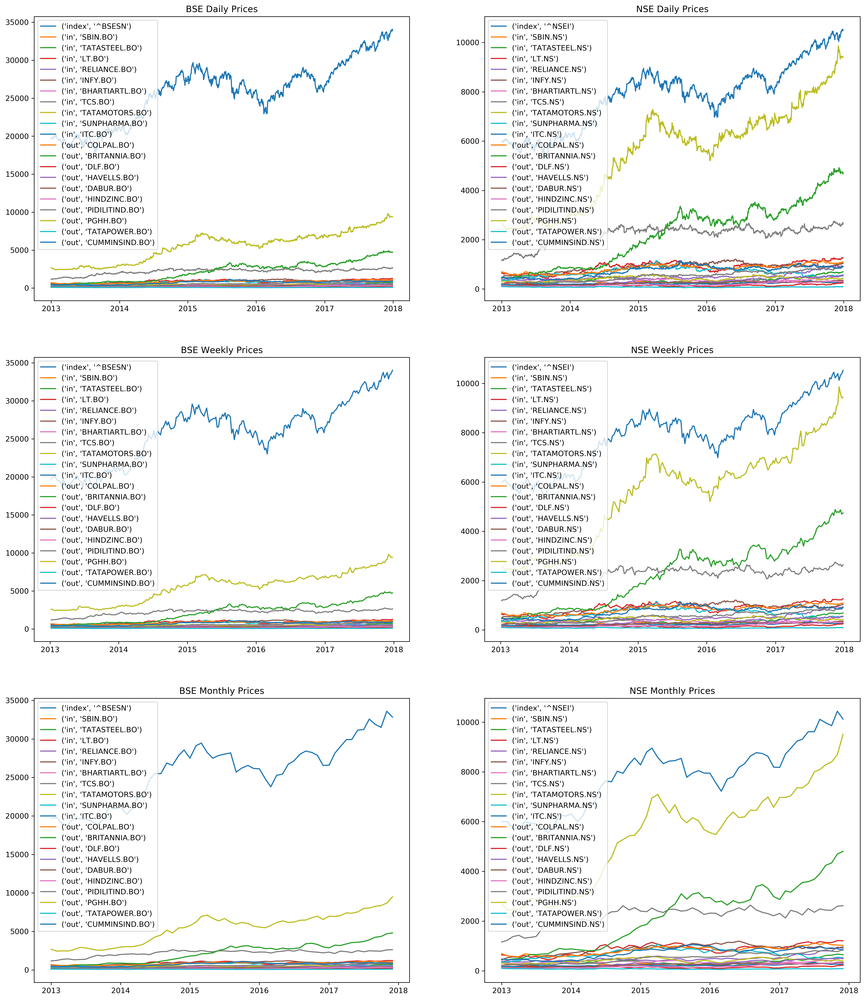

In [19]:
fig = plt.figure(num=None, figsize=(20, 24), dpi=300, facecolor='w', edgecolor='k')

ax = fig.add_subplot(3, 2, 1)
ax.plot(bse)
plt.title('BSE Daily Prices')
plt.legend(bse.columns)

ax = fig.add_subplot(3, 2, 2)
ax.plot(nse)
plt.title('NSE Daily Prices')
plt.legend(nse.columns)

ax = fig.add_subplot(3, 2, 3)
ax.plot(bse_weekly)
plt.title('BSE Weekly Prices')
plt.legend(bse.columns)

ax = fig.add_subplot(3, 2, 4)
ax.plot(nse_weekly)
plt.title('NSE Weekly Prices')
plt.legend(nse.columns)

ax = fig.add_subplot(3, 2, 5)
ax.plot(bse_monthly)
plt.title('BSE Monthly Prices')
plt.legend(bse.columns)

ax = fig.add_subplot(3, 2, 6)
ax.plot(nse_monthly)
plt.title('NSE Monthly Prices')
plt.legend(nse.columns)

# plt.show()

plt.savefig('Prices.jpg', dpi=300, bbox_inches='tight')

In [20]:
# bse.diff()

In [21]:
# bse

In [22]:
# bse.shift(+1)

In [23]:
bse_returns = (bse.diff()/bse.shift(+1)).dropna()
# bse_returns

In [24]:
nse_returns = (nse.diff()/nse.shift(+1)).dropna()
# nse_returns

In [25]:
bse_weekly_returns = (bse_weekly.diff()/bse_weekly.shift(+1)).dropna()

nse_weekly_returns = (nse_weekly.diff()/nse_weekly.shift(+1)).dropna()

In [26]:
bse_monthly_returns = (bse_monthly.diff()/bse_monthly.shift(+1)).dropna()

nse_monthly_returns = (nse_monthly.diff()/nse_monthly.shift(+1)).dropna()

In [27]:
#Normalized Returns

In [28]:
bse_returns_ = (bse_returns - bse_returns.mean())/bse_returns.std()
nse_returns_ = (nse_returns - nse_returns.mean())/nse_returns.std()

In [29]:
bse_weekly_returns_ = (bse_weekly_returns - bse_weekly_returns.mean())/bse_weekly_returns.std()
nse_weekly_returns_ = (nse_weekly_returns - nse_weekly_returns.mean())/nse_weekly_returns.std()

In [30]:
bse_monthly_returns_ = (bse_monthly_returns - bse_monthly_returns.mean())/bse_monthly_returns.std()
nse_monthly_returns_ = (nse_monthly_returns - nse_monthly_returns.mean())/nse_monthly_returns.std()

In [31]:
from scipy.stats import norm

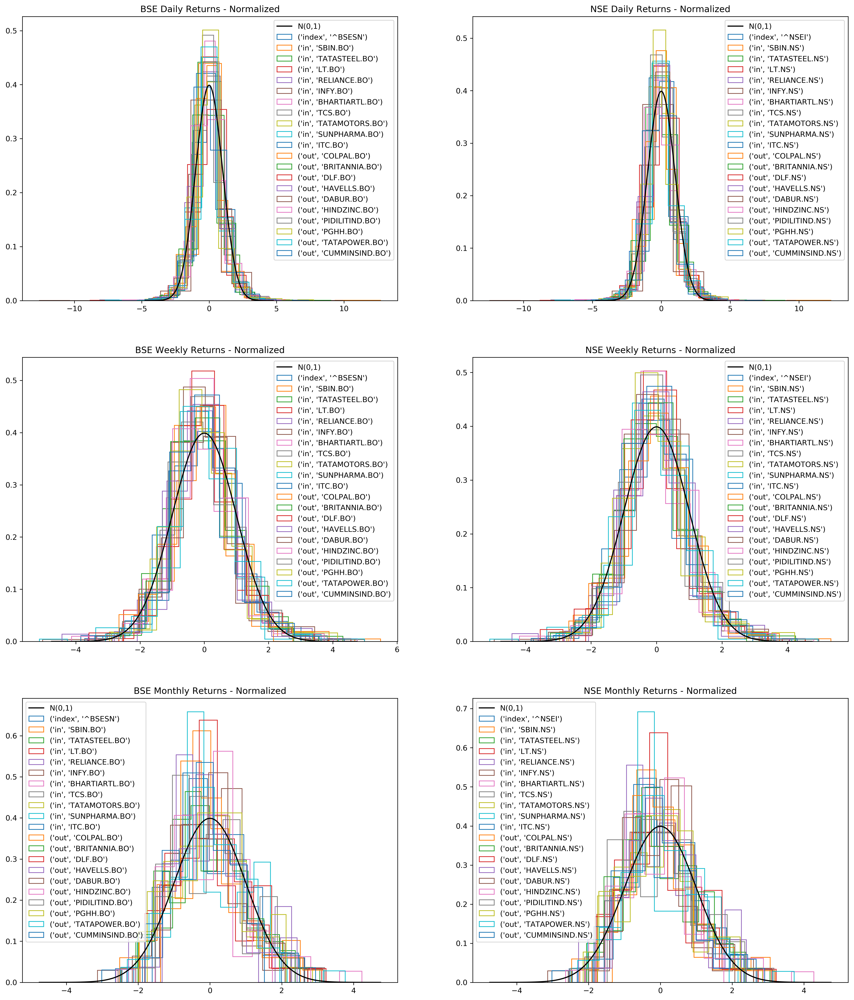

In [32]:
x = np.linspace(norm.ppf(0.000001), norm.ppf(0.999999), 10000)

fig = plt.figure(num=None, figsize=(20, 24), dpi=300, facecolor='w', edgecolor='k')

ax = fig.add_subplot(3, 2, 1)
# ax.hist(bse_returns_)
for c in bse_returns_.columns:
    plt.hist(bse_returns_[c], histtype='step', density=True)

plt.plot(x, norm.pdf(x), c='black')

plt.title('BSE Daily Returns - Normalized')
plt.legend(['N(0,1)']+list(bse.columns))

ax = fig.add_subplot(3, 2, 2)
# ax.hist(nse_returns_)
for c in nse_returns_.columns:
    plt.hist(nse_returns_[c], histtype='step', density=True)

plt.plot(x, norm.pdf(x), c='black')

plt.title('NSE Daily Returns - Normalized')
plt.legend(['N(0,1)']+list(nse.columns))

ax = fig.add_subplot(3, 2, 3)
# ax.hist(bse_weekly_returns_)
for c in bse_weekly_returns_.columns:
    plt.hist(bse_weekly_returns_[c], histtype='step', density=True)

plt.plot(x, norm.pdf(x), c='black')

plt.title('BSE Weekly Returns - Normalized')
plt.legend(['N(0,1)']+list(bse.columns))

ax = fig.add_subplot(3, 2, 4)
# ax.hist(nse_weekly_returns_)
for c in nse_weekly_returns_.columns:
    plt.hist(nse_weekly_returns_[c], histtype='step', density=True)

plt.plot(x, norm.pdf(x), c='black')

plt.title('NSE Weekly Returns - Normalized')
plt.legend(['N(0,1)']+list(nse.columns))

ax = fig.add_subplot(3, 2, 5)
# ax.hist(bse_monthly_returns_)
for c in bse_monthly_returns_.columns:
    plt.hist(bse_monthly_returns_[c], histtype='step', density=True)

plt.plot(x, norm.pdf(x), c='black')

plt.title('BSE Monthly Returns - Normalized')
plt.legend(['N(0,1)']+list(bse.columns))

ax = fig.add_subplot(3, 2, 6)
# ax.hist(nse_monthly_returns_)
for c in nse_monthly_returns_.columns:
    plt.hist(nse_monthly_returns_[c], histtype='step', density=True)

plt.plot(x, norm.pdf(x), c='black')

plt.title('NSE Monthly Returns - Normalized')
plt.legend(['N(0,1)']+list(nse.columns))

# plt.show()

plt.savefig('Normalized Returns.jpg', dpi=300, bbox_inches='tight')

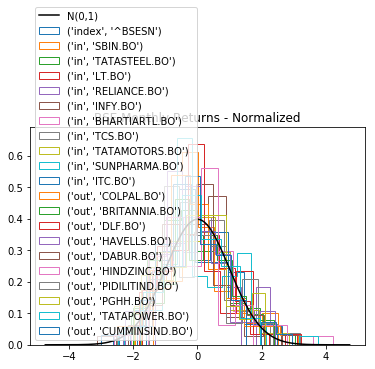

In [33]:
# plt.hist(bse_monthly_returns_, histtype='step')

for c in bse_monthly_returns_.columns:
    plt.hist(bse_monthly_returns_[c], histtype='step', density=True)
    
x = np.linspace(norm.ppf(0.000001), norm.ppf(0.999999), 10000)
plt.plot(x, norm.pdf(x), c='black')

plt.title('BSE Monthly Returns - Normalized')
plt.legend(['N(0,1)']+list(bse.columns))
    
# plt.legend(["N(0,1)"])

plt.show()

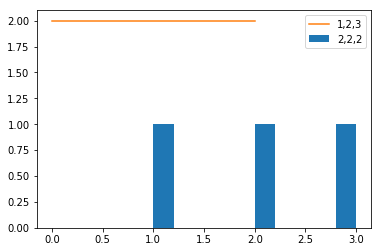

In [34]:
plt.hist([1,2,3])
plt.plot([2,2,2])
plt.legend(['1,2,3', '2,2,2'])

In [35]:
list(bse.columns)

[('index', '^BSESN'),
 ('in', 'SBIN.BO'),
 ('in', 'TATASTEEL.BO'),
 ('in', 'LT.BO'),
 ('in', 'RELIANCE.BO'),
 ('in', 'INFY.BO'),
 ('in', 'BHARTIARTL.BO'),
 ('in', 'TCS.BO'),
 ('in', 'TATAMOTORS.BO'),
 ('in', 'SUNPHARMA.BO'),
 ('in', 'ITC.BO'),
 ('out', 'COLPAL.BO'),
 ('out', 'BRITANNIA.BO'),
 ('out', 'DLF.BO'),
 ('out', 'HAVELLS.BO'),
 ('out', 'DABUR.BO'),
 ('out', 'HINDZINC.BO'),
 ('out', 'PIDILITIND.BO'),
 ('out', 'PGHH.BO'),
 ('out', 'TATAPOWER.BO'),
 ('out', 'CUMMINSIND.BO')]

In [36]:
a = ['N(0,1)']+list(bse.columns)
print(a)

['N(0,1)', ('index', '^BSESN'), ('in', 'SBIN.BO'), ('in', 'TATASTEEL.BO'), ('in', 'LT.BO'), ('in', 'RELIANCE.BO'), ('in', 'INFY.BO'), ('in', 'BHARTIARTL.BO'), ('in', 'TCS.BO'), ('in', 'TATAMOTORS.BO'), ('in', 'SUNPHARMA.BO'), ('in', 'ITC.BO'), ('out', 'COLPAL.BO'), ('out', 'BRITANNIA.BO'), ('out', 'DLF.BO'), ('out', 'HAVELLS.BO'), ('out', 'DABUR.BO'), ('out', 'HINDZINC.BO'), ('out', 'PIDILITIND.BO'), ('out', 'PGHH.BO'), ('out', 'TATAPOWER.BO'), ('out', 'CUMMINSIND.BO')]


In [37]:
# bse

In [38]:
# bse.shift(+1)

In [39]:
bse_returns_log = (bse/bse.shift(+1)).dropna().apply(np.log)
# bse_returns

In [40]:
nse_returns_log = (nse/nse.shift(+1)).dropna().apply(np.log)
# nse_returns


In [41]:
bse_weekly_returns_log = (bse_weekly/bse_weekly.shift(+1)).dropna().apply(np.log)
nse_weekly_returns_log = (nse_weekly/nse_weekly.shift(+1)).dropna().apply(np.log)

bse_monthly_returns_log = (bse_monthly/bse_monthly.shift(+1)).dropna().apply(np.log)
nse_monthly_returns_log = (nse_monthly/nse_monthly.shift(+1)).dropna().apply(np.log)


In [42]:
#Normalized Returns

bse_returns_log_ = (bse_returns_log - bse_returns_log.mean())/bse_returns_log.std()
nse_returns_log_ = (nse_returns_log - nse_returns_log.mean())/nse_returns_log.std()

bse_weekly_returns_log_ = (bse_weekly_returns_log - bse_weekly_returns_log.mean())/bse_weekly_returns_log.std()
nse_weekly_returns_log_ = (nse_weekly_returns_log - nse_weekly_returns.mean())/nse_weekly_returns_log.std()

bse_monthly_returns_log_ = (bse_monthly_returns_log - bse_monthly_returns_log.mean())/bse_monthly_returns_log.std()
nse_monthly_returns_log_ = (nse_monthly_returns_log - nse_monthly_returns_log.mean())/nse_monthly_returns_log.std()

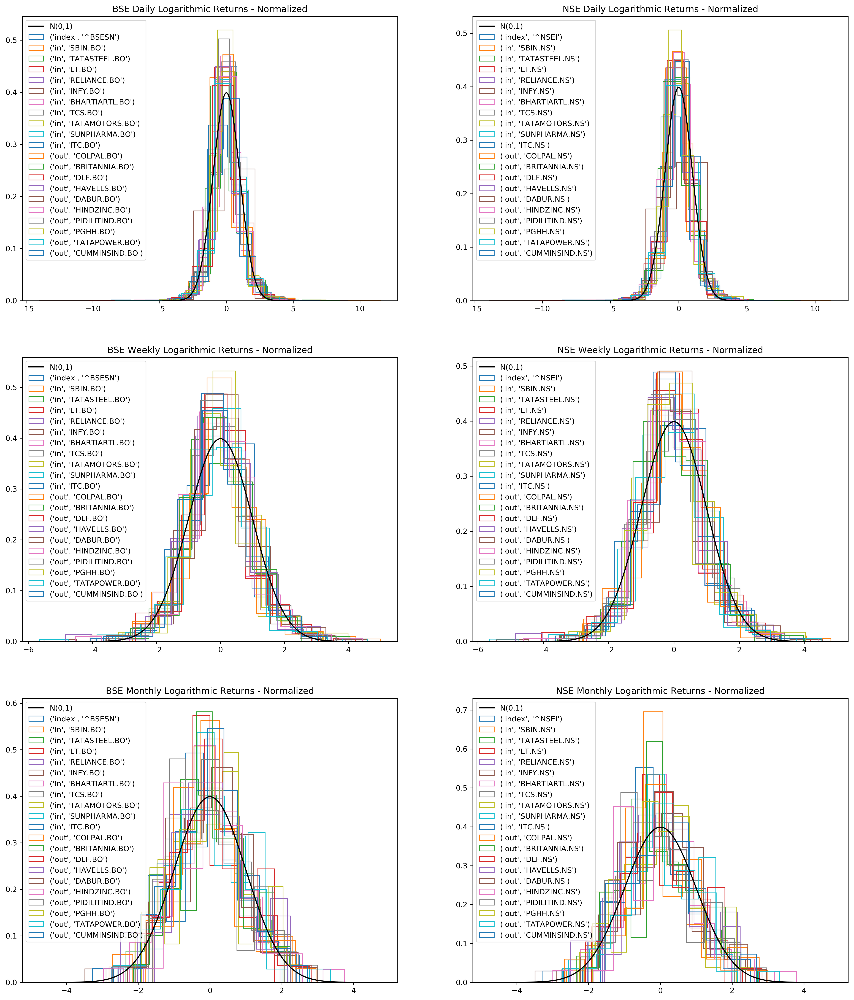

In [43]:
x = np.linspace(norm.ppf(0.000001), norm.ppf(0.999999), 10000)

fig = plt.figure(num=None, figsize=(20, 24), dpi=300, facecolor='w', edgecolor='k')

ax = fig.add_subplot(3, 2, 1)
# ax.hist(bse_returns_log_)
for c in bse_returns_log_.columns:
    plt.hist(bse_returns_log_[c], histtype='step', density=True)

plt.plot(x, norm.pdf(x), c='black')

plt.title('BSE Daily Logarithmic Returns - Normalized')
plt.legend(['N(0,1)']+list(bse.columns))

ax = fig.add_subplot(3, 2, 2)
# ax.hist(nse_returns_log_)
for c in nse_returns_log_.columns:
    plt.hist(nse_returns_log_[c], histtype='step', density=True)

plt.plot(x, norm.pdf(x), c='black')

plt.title('NSE Daily Logarithmic Returns - Normalized')
plt.legend(['N(0,1)']+list(nse.columns))

ax = fig.add_subplot(3, 2, 3)
# ax.hist(bse_weekly_returns_log_)
for c in bse_weekly_returns_log_.columns:
    plt.hist(bse_weekly_returns_log_[c], histtype='step', density=True)

plt.plot(x, norm.pdf(x), c='black')

plt.title('BSE Weekly Logarithmic Returns - Normalized')
plt.legend(['N(0,1)']+list(bse.columns))

ax = fig.add_subplot(3, 2, 4)
# ax.hist(nse_weekly_returns_log_)
for c in nse_weekly_returns_log_.columns:
    plt.hist(nse_weekly_returns_log_[c], histtype='step', density=True)

plt.plot(x, norm.pdf(x), c='black')

plt.title('NSE Weekly Logarithmic Returns - Normalized')
plt.legend(['N(0,1)']+list(nse.columns))

ax = fig.add_subplot(3, 2, 5)
# ax.hist(bse_monthly_returns_log_)
for c in bse_monthly_returns_log_.columns:
    plt.hist(bse_monthly_returns_log_[c], histtype='step', density=True)

plt.plot(x, norm.pdf(x), c='black')

plt.title('BSE Monthly Logarithmic Returns - Normalized')
plt.legend(['N(0,1)']+list(bse.columns))

ax = fig.add_subplot(3, 2, 6)
# ax.hist(nse_monthly_returns_log_)
for c in nse_monthly_returns_log_.columns:
    plt.hist(nse_monthly_returns_log_[c], histtype='step', density=True)

plt.plot(x, norm.pdf(x), c='black')

plt.title('NSE Monthly Logarithmic Returns - Normalized')
plt.legend(['N(0,1)']+list(nse.columns))

# plt.show()

plt.savefig('Normalized Logarithmic Returns.jpg', dpi=300, bbox_inches='tight')

In [44]:
pd.date_range('2016-12-31', '2016-12-31')

DatetimeIndex(['2016-12-31'], dtype='datetime64[ns]', freq='D')

In [45]:
boundary = pd.date_range('2016-12-31', '2016-12-31')[0]

In [46]:
#considering log returns
bse_returns_1316 = bse_returns_log[bse_returns_log.index <= boundary]
nse_returns_1316 = nse_returns_log[nse_returns_log.index <= boundary]

bse_weekly_returns_1316 = bse_weekly_returns_log[bse_weekly_returns_log.index <= boundary]
nse_weekly_returns_1316 = nse_weekly_returns_log[nse_weekly_returns_log.index <= boundary]

bse_monthly_returns_1316 = bse_monthly_returns_log[bse_monthly_returns_log.index <= boundary]
nse_monthly_returns_1316 = nse_monthly_returns_log[nse_monthly_returns_log.index <= boundary]

In [47]:
bse_returns_1316_mean = bse_returns_1316.mean()
bse_returns_1316_std = bse_returns_1316.std()

nse_returns_1316_mean = nse_returns_1316.mean()
nse_returns_1316_std = nse_returns_1316.std()

bse_weekly_returns_1316_mean = bse_weekly_returns_1316.mean()
bse_weekly_returns_1316_std = bse_weekly_returns_1316.std()

nse_weekly_returns_1316_mean = nse_weekly_returns_1316.mean()
nse_weekly_returns_1316_std = nse_weekly_returns_1316.std()

bse_monthly_returns_1316_mean = bse_monthly_returns_1316.mean()
bse_monthly_returns_1316_std = bse_monthly_returns_1316.std()

nse_monthly_returns_1316_mean = nse_monthly_returns_1316.mean()
nse_monthly_returns_1316_std = nse_monthly_returns_1316.std()

In [48]:
bse_17 = bse[bse.index >= boundary]
nse_17 = nse[nse.index >= boundary]

bse_weekly_17 = bse_weekly[bse_weekly.index >= boundary]
nse_weekly_17 = nse_weekly[nse_weekly.index >= boundary]

bse_monthly_17 = bse_monthly[bse_monthly.index >= boundary]
nse_monthly_17 = nse_monthly[nse_monthly.index >= boundary]

In [49]:
bse_17

index          in                                        \
                  ^BSESN     SBIN.BO TATASTEEL.BO        LT.BO RELIANCE.BO   
2017-01-02  26595.449219  241.416016   398.840546   885.430725  533.662476   
2017-01-03  26643.240234  242.654800   396.089569   890.115540  537.382507   
2017-01-04  26633.130859  240.722275   398.005432   895.320618  526.690491   
2017-01-05  26878.240234  243.249420   411.809357   907.000427  530.854004   
2017-01-06  26759.230469  243.744934   412.349731   905.178223  528.538208   
2017-01-09  26726.550781  244.785522   414.658569   898.346191  530.706177   
2017-01-10  26899.560547  245.627914   423.353577   902.055054  535.633362   
2017-01-11  27140.410156  249.641586   440.252350   919.265869  534.155212   
2017-01-12  27247.160156  248.848770   439.908478   942.885193  533.687134   
2017-01-13  27238.060547  248.650558   438.582123   935.922363  537.136169   
2017-01-16  27288.169922  253.457077   450.371948   938.655151  530.656921   
2017-01-17  27235.660156  253.853485   446.245544   941.095154  513.066895   
2017-01-18  27257.640625  255.290497   459.410858   943.958801  508.706329   
2017-01-19  27308.599609  255.984207   458.919617   940.542786  509.346863   
2017-01-20  27034.500000  248.749664   446.638519   920.403870  505.380463   
2017-01-23  27117.339844  251.821869   453.565033   906.707642  500.576508   
2017-01-24  27375.580078  252.416489   456.119507   923.722290  506.292053   
2017-01-25  27708.140625  256.975250   460.737213   943.112549  500.946045   
2017-01-27  27882.460938  264.110687   461.031952   936.736389  505.109528   
2017-01-30  27849.560547  260.642090   453.859802   939.143127  514.471130   
2017-01-31  27655.960938  257.668976   454.301910   940.054810  514.101624   
2017-02-01  28141.640625  267.876617   465.060150   969.984863  516.959351   
2017-02-02  28226.609375  270.255127   468.154968   958.631104  514.766785   
2017-02-03  28240.519531  274.912964   463.684692   962.632629  509.322205   
2017-02-06  28439.279297  274.566101   464.323303   966.211670  512.475647   
2017-02-07  28335.160156  275.012085   464.961914   976.033203  507.844055   
2017-02-08  28289.919922  274.813843   462.456573   977.858398  505.355865   
2017-02-09  28329.699219  273.376862   451.845703   968.911255  508.829498   
2017-02-10  28334.250000  273.773285   459.558228   976.716370  507.647034   
2017-02-13  28351.619141  268.966766   464.225037   974.214905  506.686188   
...                  ...         ...          ...          ...         ...   
2017-11-17  33342.800781  337.399994   701.349976  1221.250000  909.700012   
2017-11-20  33359.898438  333.049988   700.700012  1227.750000  918.849976   
2017-11-21  33478.351563  330.750000   711.250000  1221.699951  932.400024   
2017-11-22  33561.550781  335.200012   711.599976  1221.250000  930.250000   
2017-11-23  33588.078125  334.899994   711.250000  1216.300049  945.150024   
2017-11-24  33679.238281  332.250000   707.750000  1216.300049  949.500000   
2017-11-27  33724.441406  335.250000   701.849976  1222.599976  950.700012   
2017-11-28  33618.589844  332.649994   704.250000  1212.300049  942.950012   
2017-11-29  33602.761719  328.799988   709.299988  1217.300049  945.450012   
2017-11-30  33149.351563  320.450012   695.150024  1216.849976  922.599976   
2017-12-01  32832.941406  312.549988   680.700012  1212.599976  909.849976   
2017-12-04  32869.718750  313.299988   687.700012  1217.849976  901.500000   
2017-12-05  32802.441406  319.299988   675.950012  1207.300049  911.500000   
2017-12-06  32597.179688  312.250000   668.049988  1190.050049  927.500000   
2017-12-07  32949.210938  316.600006   687.900024  1219.150024  930.650024   
2017-12-08  33250.300781  313.149994   696.849976  1219.300049  920.950012   
2017-12-11  33455.789063  318.299988   700.000000  1221.400024  915.900024   
2017-12-12  33227.988281  318.399994   689.200012  1202.849976  915.049988   
2017-12-13  33053.039063  313.250000   68

In [50]:
import copy

# sim_bse_17 = bse_17.copy()
sim_bse_17 = copy.deepcopy(bse_17)
sim_bse_17.iloc[1:] = 0
# sim_nse_17 = nse_17.copy()
sim_nse_17 = copy.deepcopy(nse_17)
sim_nse_17.iloc[1:] = 0

# sim_bse_weekly_17 = bse_weekly_17.copy()
sim_bse_weekly_17 = copy.deepcopy(bse_weekly_17)
sim_bse_weekly_17.iloc[1:] = 0
# sim_nse_weekly_17 = nse_weekly_17.copy()
sim_nse_weekly_17 = copy.deepcopy(nse_weekly_17)
sim_nse_weekly_17.iloc[1:] = 0

# sim_bse_monthly_17 = bse_monthly_17.copy()
sim_bse_monthly_17 = copy.deepcopy(bse_monthly_17)
sim_bse_monthly_17.iloc[1:] = 0
# sim_nse_monthly_17 = nse_monthly_17.copy()
sim_nse_monthly_17 = copy.deepcopy(nse_monthly_17)
sim_nse_monthly_17.iloc[1:] = 0

In [51]:
print(len(bse_17))
nse_monthly_17

248


index          in                                        \
                   ^NSEI     SBIN.NS TATASTEEL.NS        LT.NS RELIANCE.NS   
2017-01-02   8179.500000  241.416748   380.404999   884.629150  534.651062   
2017-02-01   8716.400391  268.273865   443.860168   969.637085  517.184143   
2017-03-01   8945.799805  269.314453   467.942352   960.462830  608.263489   
2017-04-03   9237.849609  290.522644   454.381195  1080.732910  677.318298   
2017-05-01   9313.799805  285.716125   416.223511  1126.965088  675.298157   
2017-06-01   9616.099609  287.450012   464.949402  1166.492310  654.456055   
2017-07-03   9615.000000  274.850006   514.937683  1097.812500  680.471741   
2017-08-01  10114.650391  309.000000   545.346008  1175.658813  801.799988   
2017-09-01   9974.400391  277.850006   620.421997  1139.199951  805.049988   
2017-10-02   9859.500000  251.300003   629.567993  1134.900024  798.349976   
2017-11-01  10440.500000  319.850006   673.870972  1215.300049  952.549988   
2017-12-01  10121.799805  312.750000   648.718018  1211.650024  910.099976   

                                                                              \
               INFY.NS BHARTIARTL.NS       TCS.NS TATAMOTORS.NS SUNPHARMA.NS   
2017-01-02  972.410095    308.217255  2310.274658    487.049988   629.817383   
2017-02-01  890.477417    342.012115  2127.058594    542.250000   621.374084   
2017-03-01  995.770935    359.504211  2432.837891    449.450012   690.012878   
2017-04-03  979.889465    338.741638  2366.265869    470.399994   687.777893   
2017-05-01  896.159729    344.489777  2246.760010    451.250000   628.575684   
2017-06-01  958.024109    363.617035  2505.492676    476.649994   504.062500   
2017-07-03  938.792603    378.631500  2354.921143    430.250000   548.315125   
2017-08-01  991.703796    414.361786  2488.956787    446.899994   530.236572   
2017-09-01  907.282532    419.826324  2443.986328    390.850006   482.954376   
2017-10-02  891.108337    382.170624  2436.026855    416.000000   502.649994   
2017-11-01  927.049988    535.625061  2596.693359    437.750000   548.700012   
2017-12-01  958.799988    481.029266  2623.729004    398.899994   525.950012   

                ...               out                                       \
                ...         COLPAL.NS BRITANNIA.NS      DLF.NS  HAVELLS.NS   
2017-01-02      ...        888.232727  2870.066162  117.475334  339.380249   
2017-02-01      ...        882.510498  3216.389160  142.316376  423.915070   
2017-03-01      ...        885.272949  3162.944336  151.668884  407.385345   
2017-04-03      ...        993.107971  3372.448242  145.334915  465.413055   
2017-05-01      ...       1025.700684  3553.663818  187.396439  475.539368   
2017-06-01      ...       1028.529297  3585.432373  174.926422  481.595306   
2017-07-03      ...       1124.901123  3682.727295  192.146896  464.850006   
2017-08-01      ...       1061.728516  3907.500000  191.553101  467.600006   
2017-09-01      ...       1115.819824  4243.950195  189.623215  486.850006   
2017-10-02      ...       1051.654541  4340.049805  167.449997  495.149994   
2017-11-01      ...       1036.519409  4697.250000  208.649994  491.750000   
2017-12-01      ...       1024.813232  4805.950195  225.899994  508.299988   

                                                                            \
              DABUR.NS HINDZINC.NS PIDILITIND.NS      PGHH.NS TATAPOWER.NS   
2017-01-02  275.204163  257.903351    600.995972  6973.354492    74.140106   
2017-02-01  275.402740  304.754242    687.839661  6974.450684    79.154884   
2017-03-01  274.211182  316.181274    685.205017  7034.517090    80.580650   
2017-04-03  278.332031  289.750031    698.875305  7364.257324    87.709511   
2017-05-01  282.899750  267.094666    715.975647  7356.730957    82.301414   
2017-06-01  283.346588  237.185638    761.261597  7536.430664    79.351540   
2017-07-03  292.928833  263.368469    813.158997  8004.298340    79.056557   
2017-08-01

In [52]:
sim_nse_monthly_17

index          in                                      \
             ^NSEI     SBIN.NS TATASTEEL.NS      LT.NS RELIANCE.NS   
2017-01-02  8179.5  241.416748   380.404999  884.62915  534.651062   
2017-02-01     0.0    0.000000     0.000000    0.00000    0.000000   
2017-03-01     0.0    0.000000     0.000000    0.00000    0.000000   
2017-04-03     0.0    0.000000     0.000000    0.00000    0.000000   
2017-05-01     0.0    0.000000     0.000000    0.00000    0.000000   
2017-06-01     0.0    0.000000     0.000000    0.00000    0.000000   
2017-07-03     0.0    0.000000     0.000000    0.00000    0.000000   
2017-08-01     0.0    0.000000     0.000000    0.00000    0.000000   
2017-09-01     0.0    0.000000     0.000000    0.00000    0.000000   
2017-10-02     0.0    0.000000     0.000000    0.00000    0.000000   
2017-11-01     0.0    0.000000     0.000000    0.00000    0.000000   
2017-12-01     0.0    0.000000     0.000000    0.00000    0.000000   

                                                                              \
               INFY.NS BHARTIARTL.NS       TCS.NS TATAMOTORS.NS SUNPHARMA.NS   
2017-01-02  972.410095    308.217255  2310.274658    487.049988   629.817383   
2017-02-01    0.000000      0.000000     0.000000      0.000000     0.000000   
2017-03-01    0.000000      0.000000     0.000000      0.000000     0.000000   
2017-04-03    0.000000      0.000000     0.000000      0.000000     0.000000   
2017-05-01    0.000000      0.000000     0.000000      0.000000     0.000000   
2017-06-01    0.000000      0.000000     0.000000      0.000000     0.000000   
2017-07-03    0.000000      0.000000     0.000000      0.000000     0.000000   
2017-08-01    0.000000      0.000000     0.000000      0.000000     0.000000   
2017-09-01    0.000000      0.000000     0.000000      0.000000     0.000000   
2017-10-02    0.000000      0.000000     0.000000      0.000000     0.000000   
2017-11-01    0.000000      0.000000     0.000000      0.000000     0.000000   
2017-12-01    0.000000      0.000000     0.000000      0.000000     0.000000   

                ...              out                                       \
                ...        COLPAL.NS BRITANNIA.NS      DLF.NS  HAVELLS.NS   
2017-01-02      ...       888.232727  2870.066162  117.475334  339.380249   
2017-02-01      ...         0.000000     0.000000    0.000000    0.000000   
2017-03-01      ...         0.000000     0.000000    0.000000    0.000000   
2017-04-03      ...         0.000000     0.000000    0.000000    0.000000   
2017-05-01      ...         0.000000     0.000000    0.000000    0.000000   
2017-06-01      ...         0.000000     0.000000    0.000000    0.000000   
2017-07-03      ...         0.000000     0.000000    0.000000    0.000000   
2017-08-01      ...         0.000000     0.000000    0.000000    0.000000   
2017-09-01      ...         0.000000     0.000000    0.000000    0.000000   
2017-10-02      ...         0.000000     0.000000    0.000000    0.000000   
2017-11-01      ...         0.000000     0.000000    0.000000    0.000000   
2017-12-01      ...         0.000000     0.000000    0.000000    0.000000   

                                                                            \
              DABUR.NS HINDZINC.NS PIDILITIND.NS      PGHH.NS TATAPOWER.NS   
2017-01-02  275.204163  257.903351    600.995972  6973.354492    74.140106   
2017-02-01    0.000000    0.000000      0.000000     0.000000     0.000000   
2017-03-01    0.000000    0.000000      0.000000     0.000000     0.000000   
2017-04-03    0.000000    0.000000      0.000000     0.000000     0.000000   
2017-05-01    0.000000    0.000000      0.000000     0.000000     0.000000   
2017-06-01    0.000000    0.000000      0.000000     0.000000     0.000000   
2017-07-03    0.000000    0.000000      0.000000     0.000000     0.000000   
2017-08-01    0.000000    0.000000      0.000000     0.000000     0.000000   
2017-09-01    0.000000    0.000000      0.000000    

In [53]:
# def sim(S, mu, sigma):
#     for i in range(1,len(S)):
#         S[i] = S[i-1]*(1 + mu + sigma*np.random.randn())

In [54]:
# sim_bse_17.apply(sim, axis=0, args=(bse_returns_1316_mean, bse_returns_1316_std))
# sim_nse_17.apply(sim, axis=0, args=(nse_returns_1316_mean, nse_returns_1316_std))

# sim_bse_weekly_17.apply(sim, axis=0, args=(bse_weekly_returns_1316_mean, bse_weekly_returns_1316_std))
# sim_nse_weekly_17.apply(sim, axis=0, args=(nse_weekly_returns_1316_mean, nse_weekly_returns_1316_std))

# sim_bse_monthly_17.apply(sim, axis=0, args=(bse_monthly_returns_1316_mean, bse_monthly_returns_1316_std))
# sim_nse_monthly_17.apply(sim, axis=0, args=(nse_monthly_returns_1316_mean, nse_monthly_returns_1316_std))

In [55]:
for i in range(1, len(sim_bse_17.index)):
    sim_bse_17.iloc[i] = sim_bse_17.iloc[i-1]*np.exp(bse_returns_1316_mean + bse_returns_1316_std*np.random.randn(21))
    sim_nse_17.iloc[i] = sim_nse_17.iloc[i-1]*np.exp(nse_returns_1316_mean + nse_returns_1316_std*np.random.randn(21))

for i in range(1, len(sim_bse_weekly_17.index)):
    sim_bse_weekly_17.iloc[i] = sim_bse_weekly_17.iloc[i-1]*np.exp(bse_weekly_returns_1316_mean + bse_weekly_returns_1316_std*np.random.randn(21))
    sim_nse_weekly_17.iloc[i] = sim_nse_weekly_17.iloc[i-1]*np.exp(nse_weekly_returns_1316_mean + nse_weekly_returns_1316_std*np.random.randn(21))

for i in range(1, len(sim_bse_monthly_17.index)):
    sim_bse_monthly_17.iloc[i] = sim_bse_monthly_17.iloc[i-1]*np.exp(bse_monthly_returns_1316_mean + bse_monthly_returns_1316_std*np.random.randn(21))
    sim_nse_monthly_17.iloc[i] = sim_nse_monthly_17.iloc[i-1]*np.exp(nse_monthly_returns_1316_mean + nse_monthly_returns_1316_std*np.random.randn(21))


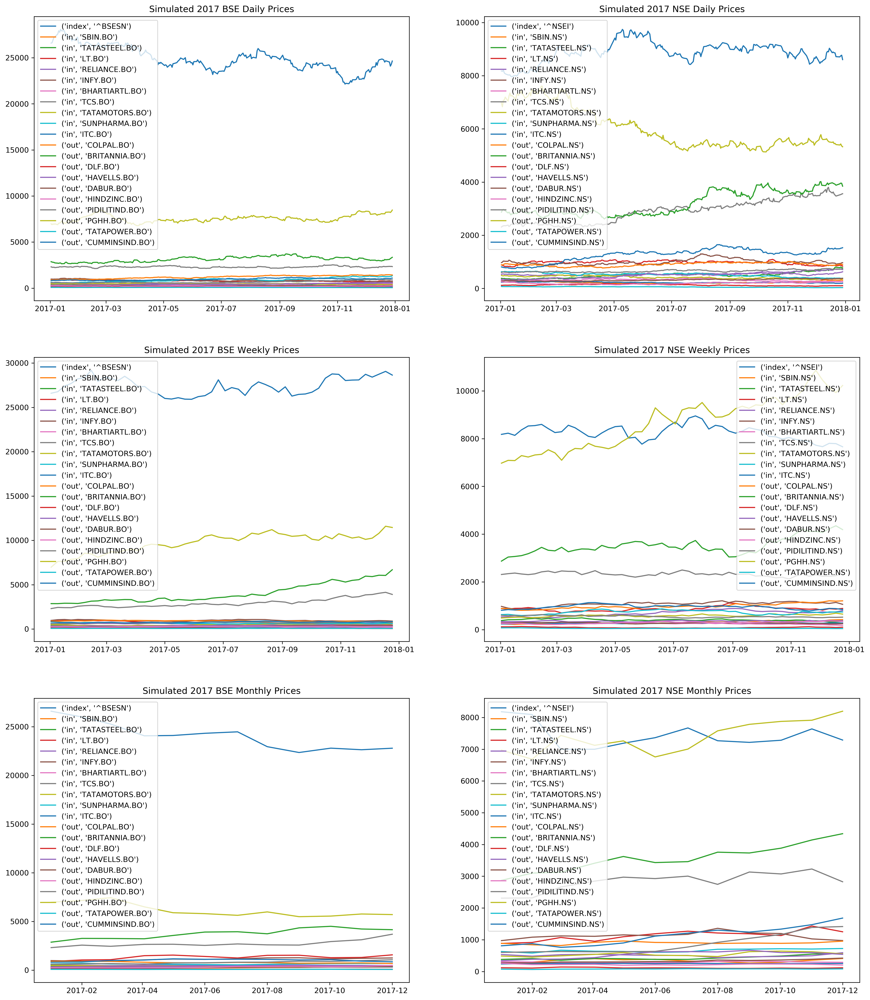

In [56]:
fig = plt.figure(num=None, figsize=(20, 24), dpi=300, facecolor='w', edgecolor='k')

ax = fig.add_subplot(3, 2, 1)
ax.plot(sim_bse_17)
plt.title('Simulated 2017 BSE Daily Prices')
plt.legend(bse.columns)

ax = fig.add_subplot(3, 2, 2)
ax.plot(sim_nse_17)
plt.title('Simulated 2017 NSE Daily Prices')
plt.legend(nse.columns)

ax = fig.add_subplot(3, 2, 3)
ax.plot(sim_bse_weekly_17)
plt.title('Simulated 2017 BSE Weekly Prices')
plt.legend(bse.columns)

ax = fig.add_subplot(3, 2, 4)
ax.plot(sim_nse_weekly_17)
plt.title('Simulated 2017 NSE Weekly Prices')
plt.legend(nse.columns)

ax = fig.add_subplot(3, 2, 5)
ax.plot(sim_bse_monthly_17)
plt.title('Simulated 2017 BSE Monthly Prices')
plt.legend(bse.columns)

ax = fig.add_subplot(3, 2, 6)
ax.plot(sim_nse_monthly_17)
plt.title('Simulated 2017 NSE Monthly Prices')
plt.legend(nse.columns)

# plt.show()

plt.savefig('Simulated 2017 Prices.jpg', dpi=300, bbox_inches='tight')

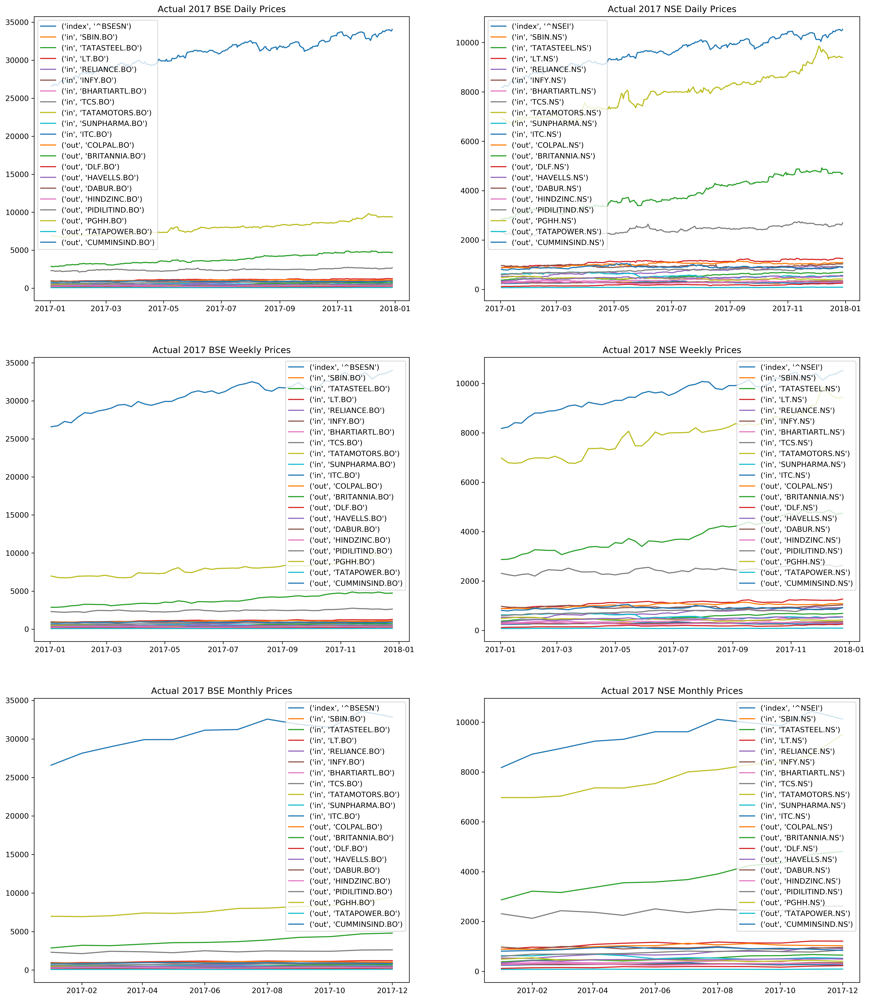

In [57]:
fig = plt.figure(num=None, figsize=(20, 24), dpi=300, facecolor='w', edgecolor='k')

ax = fig.add_subplot(3, 2, 1)
ax.plot(bse_17)
plt.title('Actual 2017 BSE Daily Prices')
plt.legend(bse.columns)

ax = fig.add_subplot(3, 2, 2)
ax.plot(nse_17)
plt.title('Actual 2017 NSE Daily Prices')
plt.legend(nse.columns)

ax = fig.add_subplot(3, 2, 3)
ax.plot(bse_weekly_17)
plt.title('Actual 2017 BSE Weekly Prices')
plt.legend(bse.columns)

ax = fig.add_subplot(3, 2, 4)
ax.plot(nse_weekly_17)
plt.title('Actual 2017 NSE Weekly Prices')
plt.legend(nse.columns)

ax = fig.add_subplot(3, 2, 5)
ax.plot(bse_monthly_17)
plt.title('Actual 2017 BSE Monthly Prices')
plt.legend(bse.columns)

ax = fig.add_subplot(3, 2, 6)
ax.plot(nse_monthly_17)
plt.title('Actual 2017 NSE Monthly Prices')
plt.legend(nse.columns)

# plt.show()

plt.savefig('Actual 2017 Prices.jpg', dpi=300, bbox_inches='tight')

In [58]:
bse.index == nse.index

array([ True,  True,  True, ...,  True,  True,  True])

In [59]:
bse.columns

MultiIndex(levels=[['index', 'in', 'out'], ['BHARTIARTL.BO', 'BRITANNIA.BO', 'COLPAL.BO', 'CUMMINSIND.BO', 'DABUR.BO', 'DLF.BO', 'HAVELLS.BO', 'HINDZINC.BO', 'INFY.BO', 'ITC.BO', 'LT.BO', 'PGHH.BO', 'PIDILITIND.BO', 'RELIANCE.BO', 'SBIN.BO', 'SUNPHARMA.BO', 'TATAMOTORS.BO', 'TATAPOWER.BO', 'TATASTEEL.BO', 'TCS.BO', '^BSESN']],
           labels=[[0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2], [20, 14, 18, 10, 13, 8, 0, 19, 16, 15, 9, 2, 1, 5, 6, 4, 7, 12, 11, 17, 3]])

In [60]:
S = bse['index',"^BSESN"]

In [61]:
S[2]

19764.779297